In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 

# Loading Data

In [ ]:
notes_path = '/home/mastermind63/Documents/UT Austin/Spring 2025/AI in Healthcare/Assignments/Assignment 2: MIMIC Visualization/mimic-iii-clinical-database-1.4/NOTEEVENTS.csv.gz'
diagnoses_path = '/home/mastermind63/Documents/UT Austin/Spring 2025/AI in Healthcare/Assignments/Assignment 2: MIMIC Visualization/mimic-iii-clinical-database-1.4/DIAGNOSES_ICD.csv.gz'
patients_path = '/home/mastermind63/Documents/UT Austin/Spring 2025/AI in Healthcare/Assignments/Assignment 2: MIMIC Visualization/mimic-iii-clinical-database-1.4/PATIENTS.csv.gz'
d_diagnoses_path = '/home/mastermind63/Documents/UT Austin/Spring 2025/AI in Healthcare/Assignments/Assignment 2: MIMIC Visualization/mimic-iii-clinical-database-1.4/D_ICD_DIAGNOSES.csv.gz'

In [12]:
notes_df = pd.read_csv(notes_path)
notes_df.info()
notes_df.iloc[0]

diagnoses_df = pd.read_csv(diagnoses_path)
diagnoses_df.info()
diagnoses_df.iloc[0]

d_diagnoses = pd.read_csv(d_diagnoses_path)

/tmp/ipykernel_265454/2864988525.py:1: DtypeWarning: Columns (4,5) have mixed types. Specify dtype option on import or set low_memory=False.
  notes_df = pd.read_csv(notes_path)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2083180 entries, 0 to 2083179
Data columns (total 11 columns):
 #   Column       Dtype  
---  ------       -----  
 0   ROW_ID       int64  
 1   SUBJECT_ID   int64  
 2   HADM_ID      float64
 3   CHARTDATE    object 
 4   CHARTTIME    object 
 5   STORETIME    object 
 6   CATEGORY     object 
 7   DESCRIPTION  object 
 8   CGID         float64
 9   ISERROR      float64
 10  TEXT         object 
dtypes: float64(3), int64(2), object(6)
memory usage: 174.8+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 651047 entries, 0 to 651046
Data columns (total 5 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   ROW_ID      651047 non-null  int64  
 1   SUBJECT_ID  651047 non-null  int64  
 2   HADM_ID     651047 non-null  int64  
 3   SEQ_NUM     651000 non-null  float64
 4   ICD9_CODE   651000 non-null  object 
dtypes: float64(1), int64(3), object(1)
memory usage: 24.8+ MB


# Deciding on an ICD Code

In [16]:

# Filter for diseases that occur more than 300 times
filtered_codes = code_counts[code_counts['COUNT'] > 300]

# Get the 10 lowest items from the filtered list
bottom_10_filtered_codes = filtered_codes.tail(10)

# Merge with descriptions
bottom_10_filtered_codes_with_desc = pd.merge(
    bottom_10_filtered_codes,
    d_diagnoses[['ICD9_CODE', 'SHORT_TITLE', 'LONG_TITLE']],
    on='ICD9_CODE',
    how='left'
)

# Display the 10 lowest items with their descriptions
print("10 lowest ICD-9 codes with counts above 300 in the dataset:")
display(bottom_10_filtered_codes_with_desc)

# Get some basic statistics
total_diagnoses = len(diagnoses_df)
unique_codes = filtered_codes.shape[0]
print(f"\nTotal diagnoses: {total_diagnoses}")
print(f"Unique ICD-9 codes with counts above 300: {unique_codes}")

# Information about the least common code in the filtered list
bottom_filtered_code = bottom_10_filtered_codes_with_desc.iloc[-1]
print(f"The least common code with counts above 300 is {bottom_filtered_code['ICD9_CODE']} ({bottom_filtered_code['LONG_TITLE']})")
print(f"It appears {bottom_filtered_code['COUNT']} times ({bottom_filtered_code['COUNT']/total_diagnoses*100:.2f}% of all diagnoses)")

# Function to search for specific conditions in the filtered list
def search_condition_filtered(keyword):
    """Search for ICD-9 codes related to a specific keyword in their descriptions within the filtered list"""
    condition_codes = bottom_10_filtered_codes_with_desc[
        bottom_10_filtered_codes_with_desc['LONG_TITLE'].str.contains(keyword, case=False) | 
        bottom_10_filtered_codes_with_desc['SHORT_TITLE'].str.contains(keyword, case=False)
    ]
    return condition_codes.sort_values('COUNT', ascending=False)

# Example usage:
# search_condition_filtered('sepsis')
# search_condition_filtered('heart failure')

10 lowest ICD-9 codes with counts above 300 in the dataset:


,ICD9_CODE,COUNT,SHORT_TITLE,LONG_TITLE
0,340,307,Multiple sclerosis,Multiple sclerosis
1,78052,305,Insomnia NOS,"Insomnia, unspecified"
2,8052,305,Fx dorsal vertebra-close,Closed fracture of dorsal [thoracic] vertebra ...
3,5184,305,Acute lung edema NOS,"Acute edema of lung, unspecified"
4,E8786,304,Abn reac-organ rem NEC,Removal of other organ (partial) (total) causi...
5,7847,303,Epistaxis,Epistaxis
6,53085,303,Barrett's esophagus,Barrett's esophagus
7,2910,303,Delirium tremens,Alcohol withdrawal delirium
8,73313,302,Path fx vertebrae,Pathologic fracture of vertebrae
9,185,302,Malign neopl prostate,Malignant neoplasm of prostate



Total diagnoses: 651047
Unique ICD-9 codes with counts above 300: 389
The least common code with counts above 300 is 185 (Malignant neoplasm of prostate)
It appears 302 times (0.05% of all diagnoses)


# Looking for Insomnia and Multiple Sclerosis with SpaCy

### Insomnia first

In [ ]:
dis_sum_df = notes_df.loc[notes_df['CATEGORY'] == 'Discharge summary', ['SUBJECT_ID', 'HADM_ID', 'TEXT']]
dis_sum_df['subj_hadm'] = list(zip(dis_sum_df['SUBJECT_ID'].astype(int), dis_sum_df['HADM_ID'].astype(int)))

# I decided to focus on insomnia related diagnoses
disease_list = ['78052']
disease_df = diagnoses_df[diagnoses_df['ICD9_CODE'].isin(disease_list)].copy()
disease_df['subj_hadm'] = list(zip(disease_df['SUBJECT_ID'].astype(int),
                               disease_df['HADM_ID'].astype(int)))

insomnia_patients_df = dis_sum_df[['TEXT', 'subj_hadm']]\
    .join(disease_df.set_index('subj_hadm')['ICD9_CODE'], on='subj_hadm', how='left')\
    .dropna()\
    .drop(columns=['subj_hadm'])

print('Verify that diseases extracted equals those in input list:',
      sorted(disease_list), sorted(np.unique(insomnia_patients_df['ICD9_CODE'])), sep='\n')

insomnia_patients_df.to_csv('./insomnia_summary.csv')
insomnia_patients_df.shape

Verify that diseases extracted equals those in input list:
['78052']
['78052']


(326, 2)

In [ ]:
import spacy
from spacy import displacy
nlp = spacy.load('en_core_web_sm')

def extract_entities(text):
    doc = nlp(text)
    entities = [(ent.text, ent.start_char, ent.end_char, ent.label_) for ent in doc.ents]
    return entities

selected_disease_codes = ['78052']
n = 10  # Define the number of rows to process
selected_disease_patients_df = insomnia_patients_df[insomnia_patients_df['ICD9_CODE'].isin(selected_disease_codes)].head(n)

# Print the size of selected_disease_patients_df
print("Size of selected_disease_patients_df:", selected_disease_patients_df.shape)

# Process each discharge summary text and extract entities
for index, row in selected_disease_patients_df.iterrows():
    text = row['TEXT']
    entities = extract_entities(text)
    # Visualize entities using displaCy
    doc = nlp(text)
    displacy.render(doc, style='ent', jupyter=True)



Size of selected_disease_patients_df: (10, 2)


### Multiple Sclorosis Next

In [42]:
dis_sum_df = notes_df.loc[notes_df['CATEGORY'] == 'Discharge summary', ['SUBJECT_ID', 'HADM_ID', 'TEXT']]
dis_sum_df['subj_hadm'] = list(zip(dis_sum_df['SUBJECT_ID'].astype(int), dis_sum_df['HADM_ID'].astype(int)))

# I decided to focus on multiple sclerosis related diagnoses
disease_list = ['340']
disease_df = diagnoses_df[diagnoses_df['ICD9_CODE'].isin(disease_list)].copy()
disease_df['subj_hadm'] = list(zip(disease_df['SUBJECT_ID'].astype(int),
                               disease_df['HADM_ID'].astype(int)))

ms_patients_df = dis_sum_df[['TEXT', 'subj_hadm']]\
    .join(disease_df.set_index('subj_hadm')['ICD9_CODE'], on='subj_hadm', how='left')\
    .dropna()\
    .drop(columns=['subj_hadm'])

print('Verify that diseases extracted equals those in input list:',
      sorted(disease_list), sorted(np.unique(ms_patients_df['ICD9_CODE'])), sep='\n')

ms_patients_df.to_csv('./ms_summary.csv')
ms_patients_df.shape

Verify that diseases extracted equals those in input list:
['340']
['340']


(334, 2)

In [53]:
import spacy
from spacy import displacy
nlp = spacy.load('en_core_web_sm')

selected_disease_codes = ['340']
n = 10  # Define the number of rows to process
selected_disease_patients_df = ms_patients_df[ms_patients_df['ICD9_CODE'].isin(selected_disease_codes)].head(n)

# Print the size of selected_disease_patients_df
print("Size of selected_disease_patients_df:", selected_disease_patients_df.shape)

# Process each discharge summary text and extract entities
for index, row in selected_disease_patients_df.iterrows():
    text = row['TEXT']
    entities = extract_entities(text)
    # Visualize entities using displaCy
    doc = nlp(text)
    displacy.render(doc, style='ent', jupyter=True)

Size of selected_disease_patients_df: (10, 2)


# Results with Spacey
- Not so good results, it was able to identify entities, however while it was good at dates, it was fairly bad at people, organizations, and mediations, with other domain specific terms
- Likely will need to use a more fine-tuned model to understand this information

# Trying out SciSpaCy

In [44]:
import scispacy
import spacy

### First with sci_lg on Insomnia 

In [45]:
import en_core_sci_lg
nlp = en_core_sci_lg.load()

selected_disease_codes = ['78052']
n = 10  # Define the number of rows to process
selected_disease_patients_df = insomnia_patients_df[insomnia_patients_df['ICD9_CODE'].isin(selected_disease_codes)].head(n)

# Print the size of selected_disease_patients_df
print("Size of selected_disease_patients_df:", selected_disease_patients_df.shape)

# Process each discharge summary text and extract entities
for index, row in selected_disease_patients_df.iterrows():
    text = row['TEXT']
    entities = extract_entities(text)
    # Visualize entities using displaCy
    doc = nlp(text)
    displacy.render(doc, style='ent', jupyter=True)

Size of selected_disease_patients_df: (10, 2)


### Then bc5cdr on Insomnia

In [51]:
import en_ner_bc5cdr_md
nlp = en_ner_bc5cdr_md.load()

selected_disease_codes = ['78052']
n = 10  # Define the number of rows to process
selected_disease_patients_df = insomnia_patients_df[insomnia_patients_df['ICD9_CODE'].isin(selected_disease_codes)].head(n)

# Print the size of selected_disease_patients_df
print("Size of selected_disease_patients_df:", selected_disease_patients_df.shape)

# Process each discharge summary text and extract entities
for index, row in selected_disease_patients_df.iterrows():
    text = row['TEXT']
    entities = extract_entities(text)
    # Visualize entities using displaCy
    doc = nlp(text)
    displacy.render(doc, style='ent', jupyter=True)

Size of selected_disease_patients_df: (10, 2)


Results are certainly better than spacy alone, however still not great all things considered. I think we might need to try some of the other tools, but first, lets see if it fairs better on medical notes related to MS

# MS related Notes with SciSpacy

In [52]:
import en_core_sci_lg
nlp = en_core_sci_lg.load()

selected_disease_codes = ['340']
n = 10  # Define the number of rows to process
selected_disease_patients_df = ms_patients_df[ms_patients_df['ICD9_CODE'].isin(selected_disease_codes)].head(n)

# Print the size of selected_disease_patients_df
print("Size of selected_disease_patients_df:", selected_disease_patients_df.shape)

# Process each discharge summary text and extract entities
for index, row in selected_disease_patients_df.iterrows():
    text = row['TEXT']
    entities = extract_entities(text)
    # Visualize entities using displaCy
    doc = nlp(text)
    displacy.render(doc, style='ent', jupyter=True)

Size of selected_disease_patients_df: (10, 2)


In [56]:
import en_ner_bionlp13cg_md
nlp = en_ner_bionlp13cg_md.load()

selected_disease_codes = ['340']
n = 10  # Define the number of rows to process
selected_disease_patients_df = ms_patients_df[ms_patients_df['ICD9_CODE'].isin(selected_disease_codes)].head(n)

# Print the size of selected_disease_patients_df
print("Size of selected_disease_patients_df:", selected_disease_patients_df.shape)

# Process each discharge summary text and extract entities
for index, row in selected_disease_patients_df.iterrows():
    text = row['TEXT']
    entities = extract_entities(text)
    # Visualize entities using displaCy
    doc = nlp(text)
    displacy.render(doc, style='ent', jupyter=True)

Size of selected_disease_patients_df: (10, 2)


In [57]:
import en_ner_bc5cdr_md
nlp = en_ner_bc5cdr_md.load()

selected_disease_codes = ['340']
n = 10  # Define the number of rows to process
selected_disease_patients_df = ms_patients_df[ms_patients_df['ICD9_CODE'].isin(selected_disease_codes)].head(n)

# Print the size of selected_disease_patients_df
print("Size of selected_disease_patients_df:", selected_disease_patients_df.shape)

# Process each discharge summary text and extract entities
for index, row in selected_disease_patients_df.iterrows():
    text = row['TEXT']
    entities = extract_entities(text)
    # Visualize entities using displaCy
    doc = nlp(text)
    displacy.render(doc, style='ent', jupyter=True)

Size of selected_disease_patients_df: (10, 2)


Here the outputs for MS are similarlly lackluster, while they did well with some of the pretrained SciSpacy models, I think we're gonna need some different techniques for this text

# Word2VEC usage with a the best spacy model on the insomnia dataset

In [58]:
import pandas as pd
pd.options.mode.chained_assignment = None
import numpy as np
import re

from gensim.models import word2vec

from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
%matplotlib inline

In [61]:
import spacy
#nlp = spacy.load('en_core_sci_lg')
nlp = spacy.load('en_core_web_sm')

In [68]:
selected_disease_codes = ['78052']
n = 50  # Define the number of rows to process
selected_disease_patients_df = insomnia_patients_df[insomnia_patients_df['ICD9_CODE'].isin(selected_disease_codes)].head(n)

# Print the size of selected_disease_patients_df
print("Size of selected_disease_patients_df:", selected_disease_patients_df.shape)

df = selected_disease_patients_df
# Build corpus of all the entities extracted from the notes using spaCy model.
# The corpus is an array of arrays or list of lists where each of the nested lists corresponds to a note.
corpus = []
for row in range(0, len(df)):
    str_tokens = []
    tokens = nlp(df.iloc[row]['TEXT']).ents
    for token in tokens:
        str_tokens.append(token.text)
    corpus.append(str_tokens)

print(corpus)

Size of selected_disease_patients_df: (50, 2)
[['2118-12-1', '2118-12-3', '2037-12-24', 'No Known Allergies to Drugs', '2485', 'PMH of HTN', 'HCP', '2848', 'the last two days', 'PO', 'HCP', 'Today', 'CXR', '115', 'CXR', '98.6', '103', '22', '96%', '102', '78/50', '1.8L', 'ICU', '2848', 'SOB', 'Vitamin B12 deficiency', 'EtOH', 'NAD', 'MM', 'ND', 'HSM', 'Extrem', 'XII', '81', 'Pertinent Results', 'NORMAL Anisocy-NORMAL', 'NORMAL Macrocy-NORMAL', '2849', '2850', 'Na-115', 'K-4.8 Cl-80', '2118-12-1', '2118-12-1', 'BLOOD', '2118-12-1', '2118-12-2', 'CK-MB-15', '2118-12-3', '2118-12-1', 'Baseline', 'RSR', '2118-11-7', 'aVF', '2118-12-1', '2118-12-3', 'PMH', 'CXR', 'WBC', 'EKG', 'MAT', '2852', 'DNI', 'Antibiotics', 'PO', '1000', 'NS', 'overnight', '130', '115', 'IVF', 'Aspirin', '5', '2848', 'CMO', 'BPH', 'Fosamax', '1', 'EC', '25', '0.4', '1', '10', '100', '400'], ['2201', '2201', '2143-10-4', 'Codeine / Streptokinase / Iodine\n\nAttending:[**First Name3 (LF', '3991', '57-year-old', 'S/P R T

In [75]:
from gensim.models import Word2Vec
model_spacy_50_ins = Word2Vec(corpus, min_count=1)

In [82]:
model_spacy_50_ins.wv.similar_by_word('morning')
# model1.wv.similar_by_word('Aerosol Inhaler')

[('Attending:[**First Name3 (LF', 0.5303928256034851),
 ('Wednesday', 0.508317232131958),
 ('4', 0.5076523423194885),
 ('2201', 0.5060324668884277),
 ('RA', 0.5060272812843323),
 ('Alert', 0.5059962868690491),
 ('02:04AM', 0.5022112727165222),
 ('#', 0.5021947622299194),
 ('100', 0.5007679462432861),
 ('BP', 0.4999213218688965)]

Not very promising similarities, but that is one of the drawbacks of regualr spacy

/home/mastermind63/miniconda3/envs/scispacy/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/mastermind63/miniconda3/envs/scispacy/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 9 (	) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


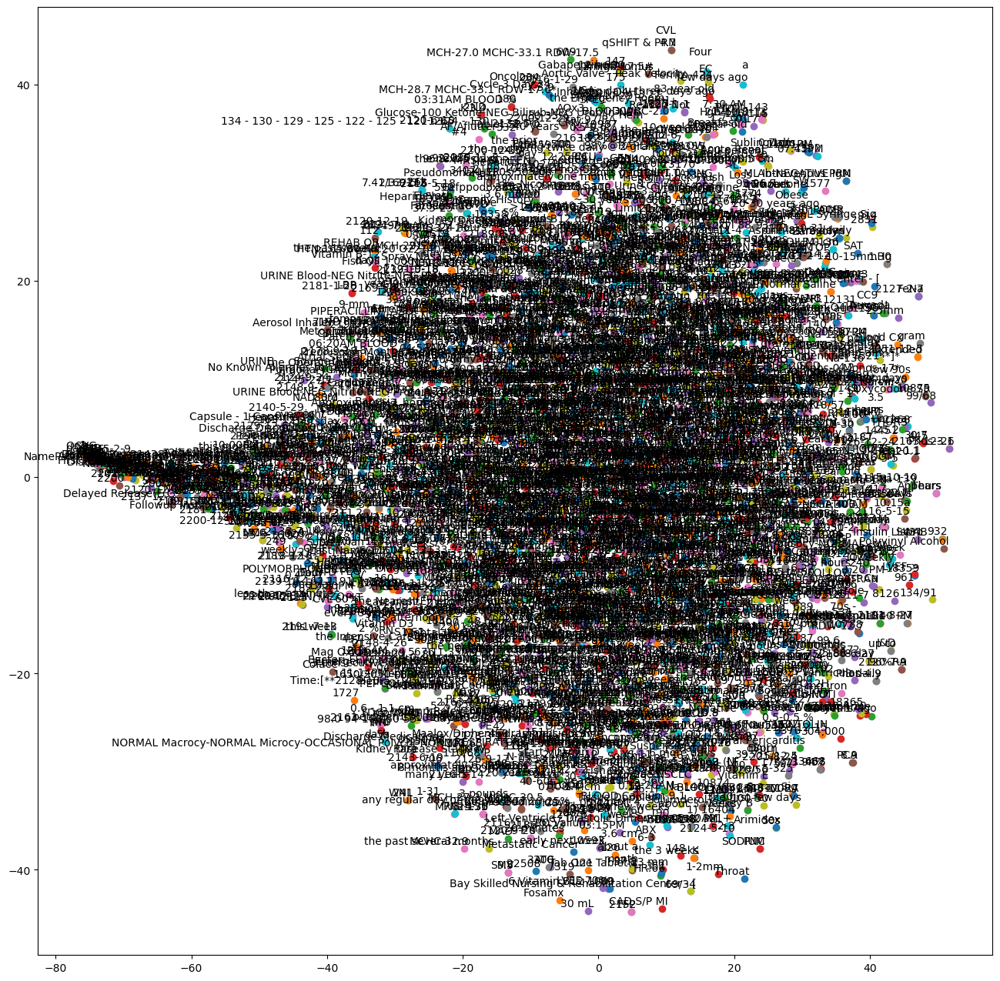

In [ ]:
def tsne_plot(model,words, preTrained=False):
    "Creates and TSNE model and plots it"
    labels = []
    tokens = []

    for word in words:
      if preTrained:
          tokens.append(model[word])
      else:
          tokens.append(model.wv[word])
      labels.append(word)

    tokens = np.array(tokens)
    tsne_model = TSNE(perplexity=30, early_exaggeration=12, n_components=2, init='pca', n_iter=1000, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])

    plt.figure(figsize=(16, 16))
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()

vocabs = model_spacy_50_ins.wv.key_to_index.keys()
new_v = np.array(list(vocabs))
tsne_plot(model_spacy_50_ins,new_v)

Thats a lot of labels, lets try not using labels to see what kind of informaiton we can see

/home/mastermind63/miniconda3/envs/scispacy/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


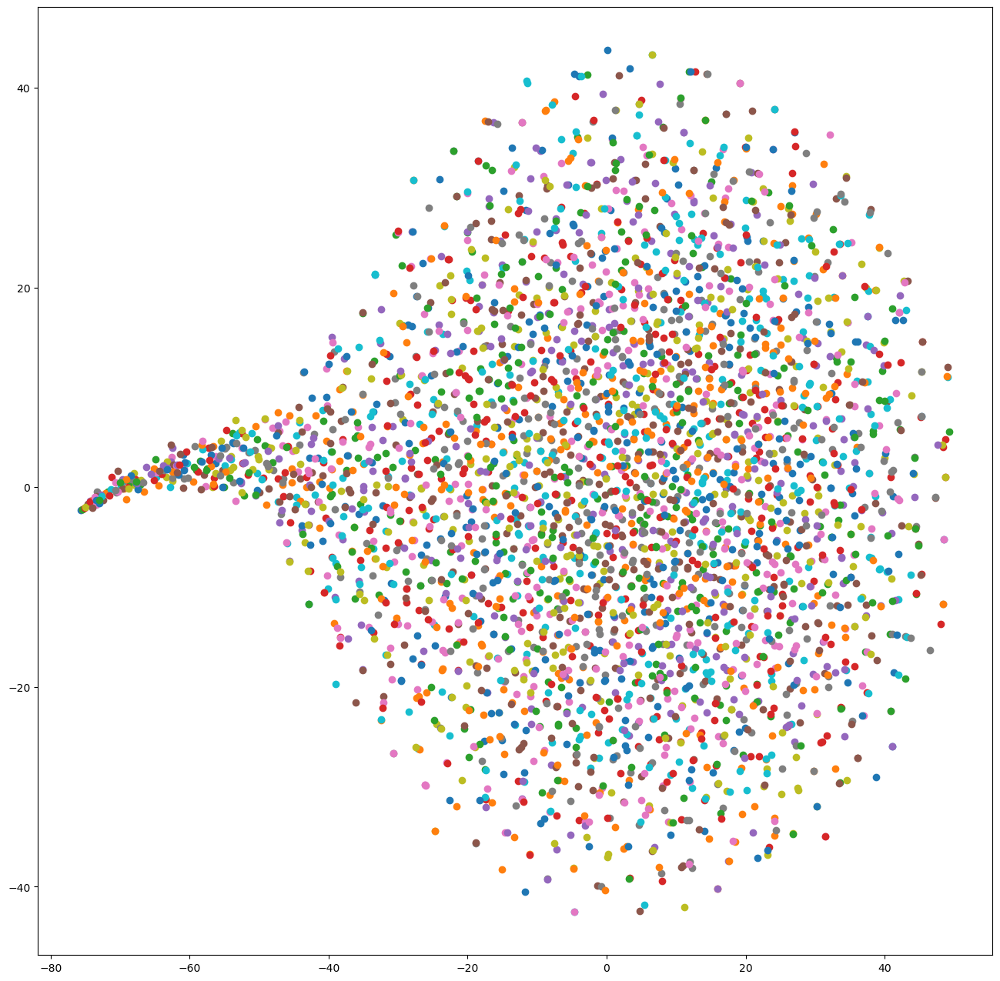

In [ ]:
vocabs = model_spacy_50_ins.wv.key_to_index.keys()
new_v = np.array(list(vocabs))
tsne_plot(model_spacy_50_ins,new_v)

It kind of looks like a speech bubble on its side

# Trying other SciSpacy Models on the same data

In [83]:
nlp = spacy.load("en_ner_bc5cdr_md")

selected_disease_codes = ['78052']
n = 50  # Define the number of rows to process
selected_disease_patients_df = insomnia_patients_df[insomnia_patients_df['ICD9_CODE'].isin(selected_disease_codes)].head(n)

# Print the size of selected_disease_patients_df
print("Size of selected_disease_patients_df:", selected_disease_patients_df.shape)

df = selected_disease_patients_df
# Build corpus of all the entities extracted from the notes using spaCy model.
# The corpus is an array of arrays or list of lists where each of the nested lists corresponds to a note.
corpus = []
for row in range(0, len(df)):
    str_tokens = []
    tokens = nlp(df.iloc[row]['TEXT']).ents
    for token in tokens:
        str_tokens.append(token.text)
    corpus.append(str_tokens)

print(corpus)

Size of selected_disease_patients_df: (50, 2)
[['Birth:  [', 'Allergies', 'Allergies', 'Name3', 'cough', 'HTN', 'congenital deafness', 'osteoporosis', 'fevers', 'cough', 'weakness', 'coughing', 'apple sauce and\navoiding thin liquids', 'sodium', 'pneumonia', '117/61', 'RA', 'levofloxacin', 'clindamycin', 'pneumonia', 'CP', 'SOB', 'Denies constipation', 'dysuria', 'incontinence', 'Hypertension', 'Osteoporosis', 'Congenital deafness', 'Vitamin B12', 'prostatic hypertrophy', 'Urinary incontinence', 'Insomnia', 'EtOH', 'Congenital deafness', 'NAD', 'OP', 'RRR', 'wheeze', 'ND', 'rigidity', 'brachioradialis and patellar reflexes intact', 'Myelos-0', 'Hypochr-NORMAL Anisocy-NORMAL Poiklo-NORMAL Macrocy-NORMAL\n[**Name (NI) 2849**] [**Name (NI) 2850**]\nPT-18.7* PTT-35.5* INR(PT)-1.7*\nUreaN-22* Creat-0.8 Na-115* K-4.8 Cl-80* HCO3', 'AnGap-17', 'Calcium-9.9', 'CK(CPK)-597', 'Sinus tachycardia', 'myocardial infarction', 'Bibasilar', 'congential deafness', 'HTN', 'osteoporosis', 'pneumonia', 'hy

In [85]:
scispacymodel = Word2Vec(corpus, min_count=1)

/home/mastermind63/miniconda3/envs/scispacy/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/mastermind63/miniconda3/envs/scispacy/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 9 (	) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


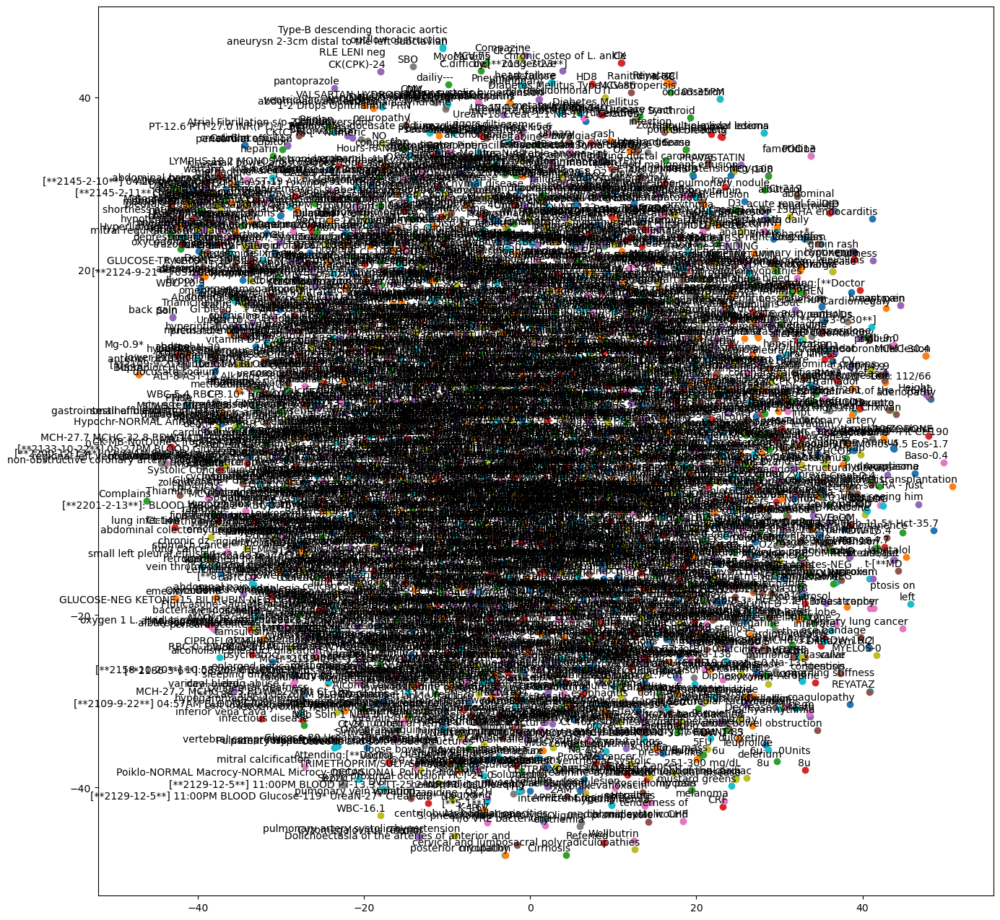

/home/mastermind63/miniconda3/envs/scispacy/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


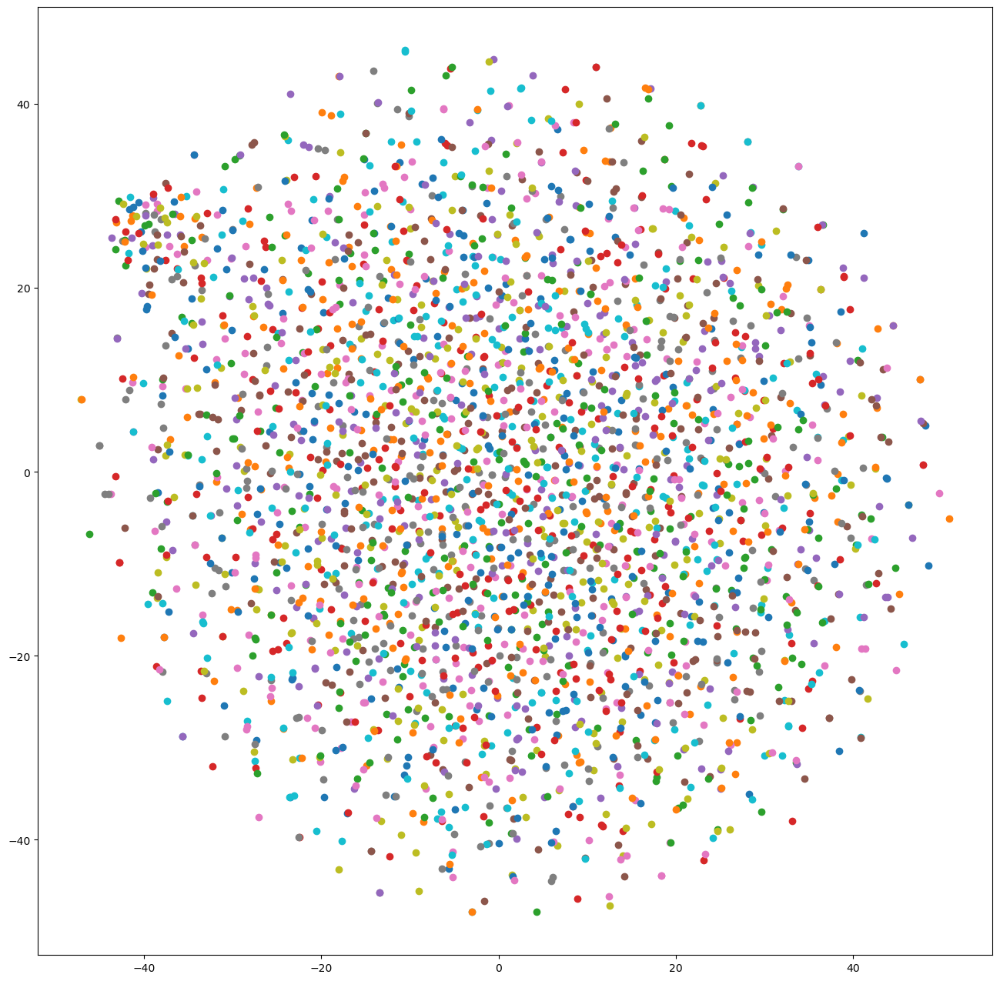

In [87]:
vocabs = scispacymodel.wv.index_to_key  # Access vocabulary using index_to_key
new_v = np.array(list(vocabs))
tsne_plot(scispacymodel, new_v)
tsne_plot(scispacymodel, new_v, show_labels=False)

/home/mastermind63/miniconda3/envs/scispacy/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


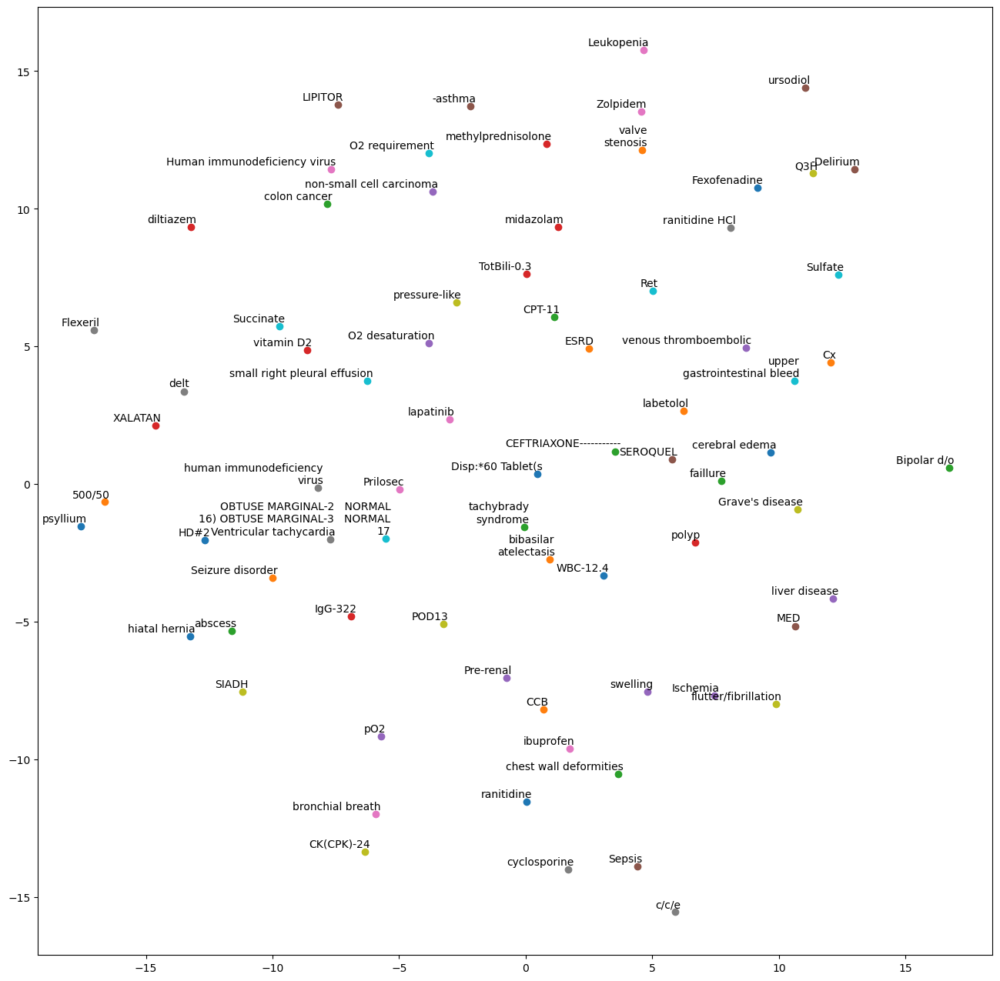

In [95]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import numpy as np

def tsne_plot_sample(model, words, sample_size=50):
    """Creates a t-SNE model and plots a sample of it."""

    labels = []
    tokens = []

    # Select a random sample of words
    selected_words = np.random.choice(words, size=sample_size, replace=False)

    for word in selected_words:
        if word in model.wv:
            tokens.append(model.wv[word])
            labels.append(word)
        else:
            print(f"Skipping '{word}' as it is not present in the model's vocabulary.")

    tsne_model = TSNE(perplexity=11, early_exaggeration=12, n_components=2, init='pca', n_iter=1000, random_state=23)
    new_values = tsne_model.fit_transform(np.array(tokens))  # Convert tokens to a NumPy array

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])

    plt.figure(figsize=(16, 16))
    for i in range(len(x)):
        plt.scatter(x[i], y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')

    plt.show()

tsne_plot_sample(scispacymodel, new_v, sample_size=75)

### This has a similar shape to the small spacy model, but has additional features
- you can see the 'tail' is smaller
- there are wider gaps between terms on the outside, and smaller gaps for close terms near the center

# What about a pre-trained model?

In [80]:
import gensim
import gensim.downloader as api

info = api.info()  # show info about available models/datasets
pretrained_model= api.load("glove-wiki-gigaword-50")  # download the model and return as object ready for use


In [81]:
pretrained_model.most_similar("morning")

[('afternoon', 0.9675531983375549),
 ('evening', 0.9153156280517578),
 ('day', 0.8744831681251526),
 ('night', 0.8691092729568481),
 ('friday', 0.8689238429069519),
 ('sunday', 0.8551512360572815),
 ('monday', 0.8480633497238159),
 ('thursday', 0.8408240675926208),
 ('hours', 0.8405066728591919),
 ('noon', 0.8400055170059204)]

In [88]:
new_corpus_in_pretrained_model = []
for word in new_v:
    if word in pretrained_model.key_to_index:
        new_corpus_in_pretrained_model.append(word)
    else:
        print(word)

NamePattern1
Allergies
Name3
Q6H
chest pain
Name8
shortness of breath
CHF
PCP
Pt
COPD
Disposition
HCO3
Birth:  [
Pattern1
mitral regurgitation
Aspirin
CAD
pleural effusion
Tablet(s
QHS
NO
Insomnia
Hypertension
NAD
Q12H
SOB
qhs
atrial fibrillation
RA
abdominal pain
breast cancer
Lasix
Q8H
O2
MMM
Sodium
Q4H
Heparin
Depression
Calcium
HTN
CTAB
Hyperlipidemia
Metoprolol
QID
dysuria
Cr
Albuterol
Docusate
Warfarin
PERRL
Acetaminophen
Pain
ASA
orthopnea
pleural effusions
Furosemide
Anemia
EtOH
GERD
Prednisone
Gabapentin
NRB
weight loss
organomegaly
GU
CP
pulmonary edema
DVT
CO2
Atrial fibrillation
Atorvastatin
LCx
back pain
UTI
Tylenol
K
Digoxin
PE
Lisinopril
RRR
lung cancer
Atenolol
heart failure
Inhaler
pO2
HCTZ
Trazodone
calTCO2
mitral valve prolapse
rhonchi
cardiomegaly
ETOH
Dyslipidemia
Na
Colchicine
Omeprazole
MG
03:15PM
docusate sodium
Anxiety
Nicotine
Oxycodone
Pantoprazole
Vancomycin
cord compression
metolazone
Dilaudid
Diabetes
atrial flutter
Captopril
Hypotension
alcohol abuse
Ca
L

/home/mastermind63/miniconda3/envs/scispacy/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


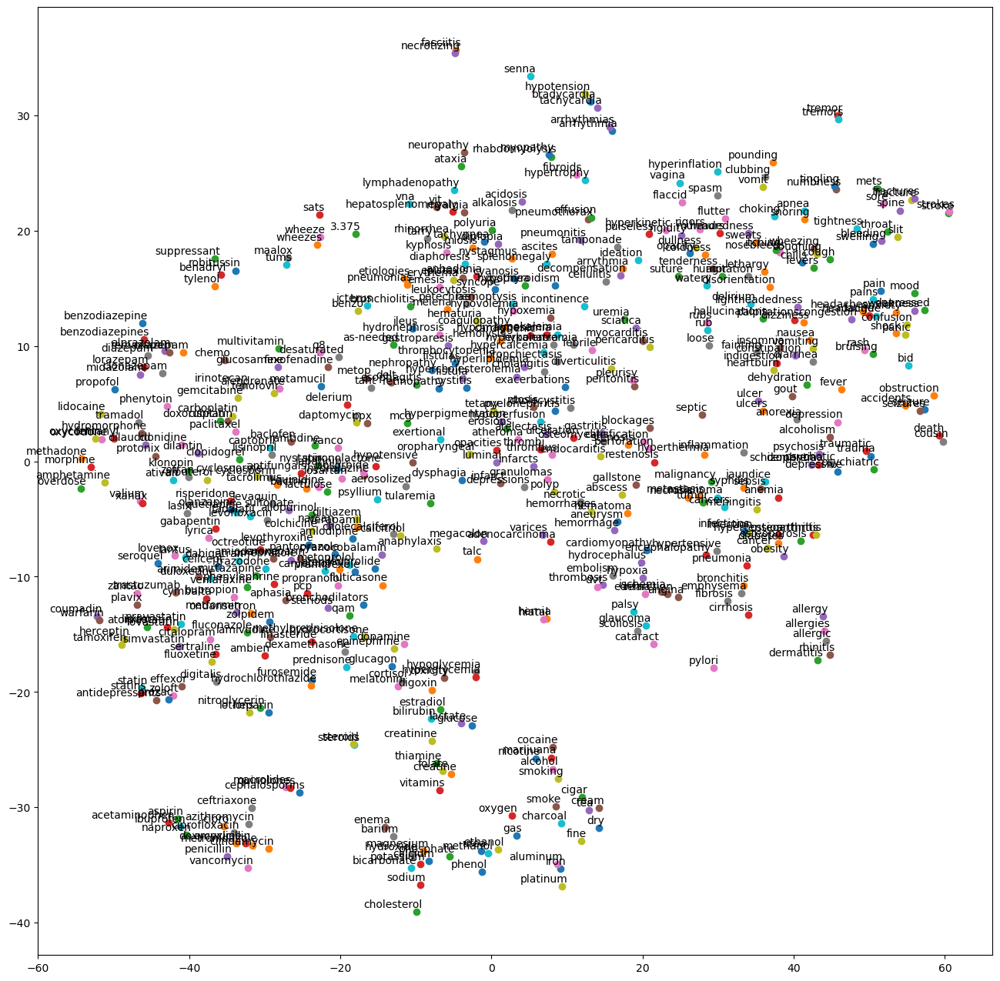

/home/mastermind63/miniconda3/envs/scispacy/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


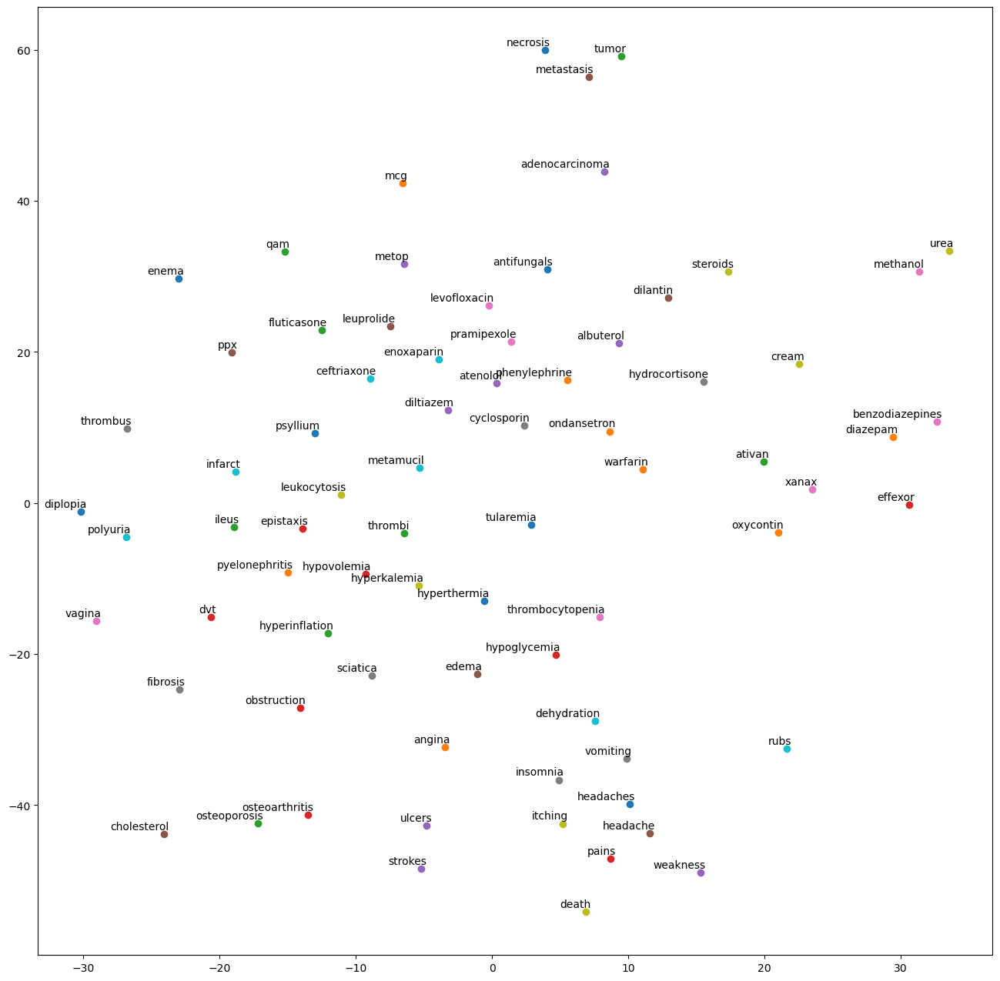

In [99]:
import numpy as np

def tsne_plot(model, words):
    "Creates a t-SNE model and plots it"
    labels = []
    tokens = []

    for word in words:
        if word in model:
            tokens.append(model[word])
            labels.append(word)
        else:
            print(f"Skipping '{word}' as it is not present in the model's vocabulary.")

    tsne_model = TSNE(perplexity=11, early_exaggeration=12, n_components=2, init='pca', n_iter=1000, random_state=23)
    new_values = tsne_model.fit_transform(np.array(tokens))  # Convert tokens to a NumPy array

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])

    plt.figure(figsize=(16, 16))
    for i in range(len(x)):
        plt.scatter(x[i], y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()
    
tsne_plot(pretrained_model,new_corpus_in_pretrained_model)

def tsne_plot_sample(model, words, sample_size=50):
    """Creates a t-SNE model and plots a sample of it."""

    labels = []
    tokens = []

    # Select a random sample of words
    selected_words = np.random.choice(words, size=sample_size, replace=False)

    for word in selected_words:
        if word in model:
            tokens.append(model[word])
            labels.append(word)
        else:
            print(f"Skipping '{word}' as it is not present in the model's vocabulary.")

    tsne_model = TSNE(perplexity=11, early_exaggeration=12, n_components=2, init='pca', n_iter=1000, random_state=23)
    new_values = tsne_model.fit_transform(np.array(tokens))  # Convert tokens to a NumPy array

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])

    plt.figure(figsize=(16, 16))
    for i in range(len(x)):
        plt.scatter(x[i], y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')

    plt.show()

tsne_plot_sample(pretrained_model, new_corpus_in_pretrained_model, sample_size=75)

# Now using MedSpacy processing

In [101]:
%pip install medspacy

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached jsonschema-4.23.0-py3-none-any.whl.metadata (7.9 kB)
  Preparing metadata (setup.py) ... done
  Using cached spacy-3.7.5-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (27 kB)
  Using cached thinc-8.2.5-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (15 kB)
  Using cached attrs-25.1.0-py3-none-any.whl.metadata (10 kB)
  Using cached jsonschema_specifications-2024.10.1-py3-none-any.whl.metadata (3.0 kB)
  Using cached referencing-0.36.2-py3-none-any.whl.metadata (2.8 kB)
Using cached spacy-3.7.5-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (6.6 MB)
Using cached jsonschema-4.23.0-py3-none-any.whl (88 kB)
Using cached attrs-25.1.0-py3-none-any.whl (63 kB)
Using cached jsonschema_specifications-2024.10.1-py3-none-any.whl (18 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 33.1

In [110]:
import en_ner_bc5cdr_md
from spacy import displacy

def process_and_visualize_clinical_text(text):
    """
    Process and visualize clinical text with entity highlighting
    """
    # Load the clinical NER model
    nlp = en_ner_bc5cdr_md.load()
    
    # Disable the parser to avoid conflicts
    if "parser" in nlp.pipe_names:
        nlp.disable_pipe("parser")
    
    doc = nlp(text)
    
    # Extract all entity labels dynamically
    entity_labels = set(ent.label_ for ent in doc.ents)

    # Define colors for known entity types and add more if needed
    colors = {
        "DISEASE": "#ff7f7f",   # Red-pink
        "CHEMICAL": "#7fafff",  # Light blue
        "GENE": "#ffa07a",      # Light salmon
        "SPECIES": "#98fb98",   # Pale green
        "VARIANT": "#dda0dd"    # Plum
    }

    # Ensure all detected entity labels have an assigned color
    for label in entity_labels:
        if label not in colors:
            colors[label] = "#d3d3d3"  # Default gray for unknown entities

    # Print entities and their labels for verification
    print("\nDetected Entities:")
    for ent in doc.ents:
        print(f"{ent.text}: {ent.label_}")

    # Use displaCy for visualization
    options = {
        "ents": list(entity_labels),  # Dynamically include all detected entities
        "colors": colors
    }

    return displacy.render(doc, style="ent", options=options, jupyter=True)

def process_clinical_documents(df, disease_codes, n_samples=50):
    """
    Process multiple clinical documents and visualize entities
    """
    # Filter dataframe
    selected_df = df[df['ICD9_CODE'].isin(disease_codes)].head(n_samples)
    print(f"Processing {len(selected_df)} records")
    
    for idx, row in selected_df.iterrows():
        print(f"\nProcessing Document {idx + 1}:")
        process_and_visualize_clinical_text(row['TEXT'])

# Run the processing
if __name__ == "__main__":
    selected_disease_codes = ['78052']
    process_clinical_documents(
        df=insomnia_patients_df,
        disease_codes=selected_disease_codes,
        n_samples=1
    )


Processing 1 records

Processing Document 299:

Detected Entities:
Birth:  [: DISEASE
Allergies: DISEASE
Allergies: DISEASE
Name3: CHEMICAL
cough: DISEASE
HTN: DISEASE
congenital deafness: DISEASE
osteoporosis: DISEASE
fevers: DISEASE
cough: DISEASE
weakness: DISEASE
coughing: DISEASE
apple sauce and
avoiding thin liquids: CHEMICAL
sodium: CHEMICAL
pneumonia: DISEASE
117/61: CHEMICAL
RA: DISEASE
levofloxacin: CHEMICAL
clindamycin: CHEMICAL
pneumonia: DISEASE
CP: CHEMICAL
SOB: DISEASE
Denies constipation: DISEASE
dysuria: DISEASE
incontinence: DISEASE
Hypertension: DISEASE
Osteoporosis: DISEASE
Congenital deafness: DISEASE
Vitamin B12: CHEMICAL
prostatic hypertrophy: DISEASE
Urinary incontinence: DISEASE
Insomnia: DISEASE
EtOH: CHEMICAL
Congenital deafness: DISEASE
NAD: CHEMICAL
OP: CHEMICAL
RRR: CHEMICAL
wheeze: DISEASE
ND: CHEMICAL
rigidity: DISEASE
brachioradialis and patellar reflexes intact: DISEASE
Myelos-0: CHEMICAL
Hypochr-NORMAL Anisocy-NORMAL Poiklo-NORMAL Macrocy-NORMAL
[**Na

In [114]:
%pip install seaborn

  Using cached seaborn-0.13.2-py3-none-any.whl.metadata (5.4 kB)
Using cached seaborn-0.13.2-py3-none-any.whl (294 kB)
Note: you may need to restart the kernel to use updated packages.



Detected Entities:
pneumonia: DISEASE
azithromycin: CHEMICAL


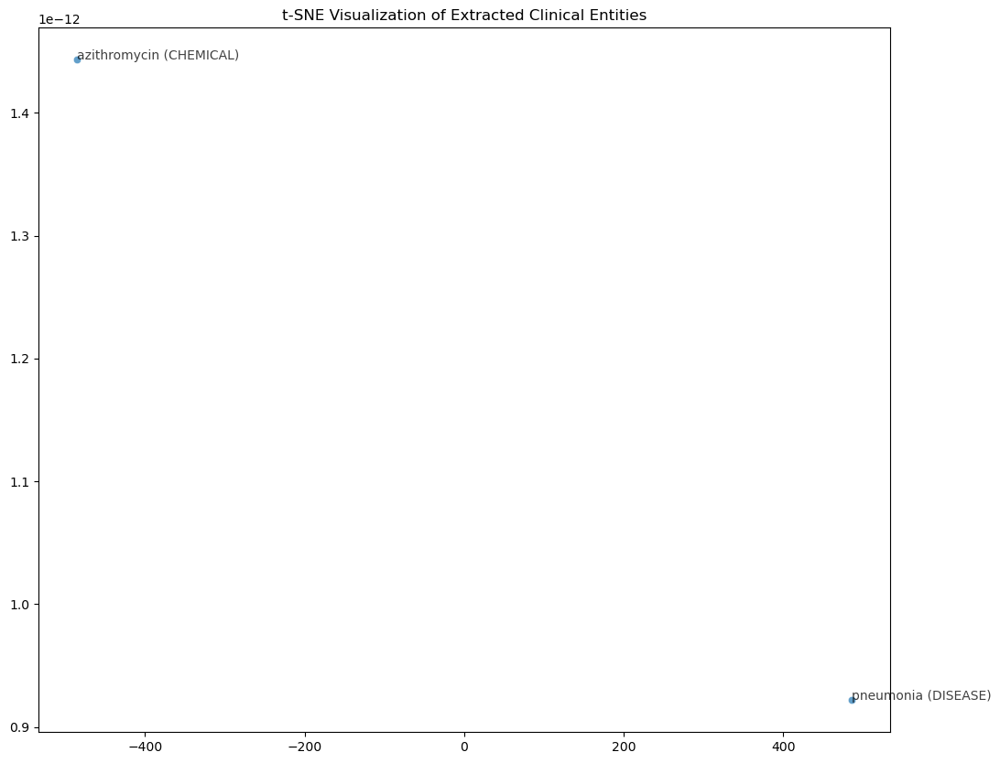

In [116]:
import en_ner_bc5cdr_md
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import seaborn as sns
import random
from spacy import displacy

def extract_entity_vectors(doc):
    """
    Extracts entity vectors from the SpaCy model.
    If an entity does not have a vector, it is skipped.
    """
    entity_labels = []
    entity_vectors = []
    
    for ent in doc.ents:
        if ent.has_vector:  # Ensure entity has a vector
            entity_labels.append(f"{ent.text} ({ent.label_})")
            entity_vectors.append(ent.vector)

    return entity_labels, np.array(entity_vectors)

def tsne_plot_entities(doc, sample_size=50):
    """
    Applies t-SNE on the entity vectors extracted from the SpaCy model
    and visualizes them in a 2D scatter plot.
    """
    entity_labels, entity_vectors = extract_entity_vectors(doc)
    
    if len(entity_vectors) == 0:
        print("No entity vectors found. Ensure your model has word vectors.")
        return
    
    # Sample a subset of entities if too many exist
    num_entities = len(entity_vectors)
    if num_entities > sample_size:
        sampled_indices = random.sample(range(num_entities), sample_size)
        entity_vectors = entity_vectors[sampled_indices]
        entity_labels = [entity_labels[i] for i in sampled_indices]

    # Ensure perplexity is valid (must be < number of samples)
    perplexity = min(10, num_entities - 1)  # Set to 10 or max possible value

    # Apply t-SNE
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42)
    reduced_vectors = tsne.fit_transform(entity_vectors)

    # Create scatter plot
    plt.figure(figsize=(12, 10))
    sns.scatterplot(x=reduced_vectors[:, 0], y=reduced_vectors[:, 1], alpha=0.7)

    # Annotate points with entity labels
    for i, label in enumerate(entity_labels):
        plt.annotate(label, (reduced_vectors[i, 0], reduced_vectors[i, 1]), fontsize=10, alpha=0.75)

    plt.title("t-SNE Visualization of Extracted Clinical Entities")
    plt.show()

def process_and_visualize_clinical_text(text):
    """
    Process and visualize clinical text with entity highlighting.
    """
    nlp = en_ner_bc5cdr_md.load()
    
    if "parser" in nlp.pipe_names:
        nlp.disable_pipe("parser")
    
    doc = nlp(text)
    
    # Print and visualize detected entities
    print("\nDetected Entities:")
    for ent in doc.ents:
        print(f"{ent.text}: {ent.label_}")

    tsne_plot_entities(doc)  # Call t-SNE visualization

    return displacy.render(doc, style="ent", jupyter=True)

# Example usage:
text_sample = """The patient was diagnosed with pneumonia and treated with azithromycin. 
                 Genetic testing revealed a BRCA1 mutation."""
process_and_visualize_clinical_text(text_sample)


Size of selected_disease_patients_df: (50, 2)


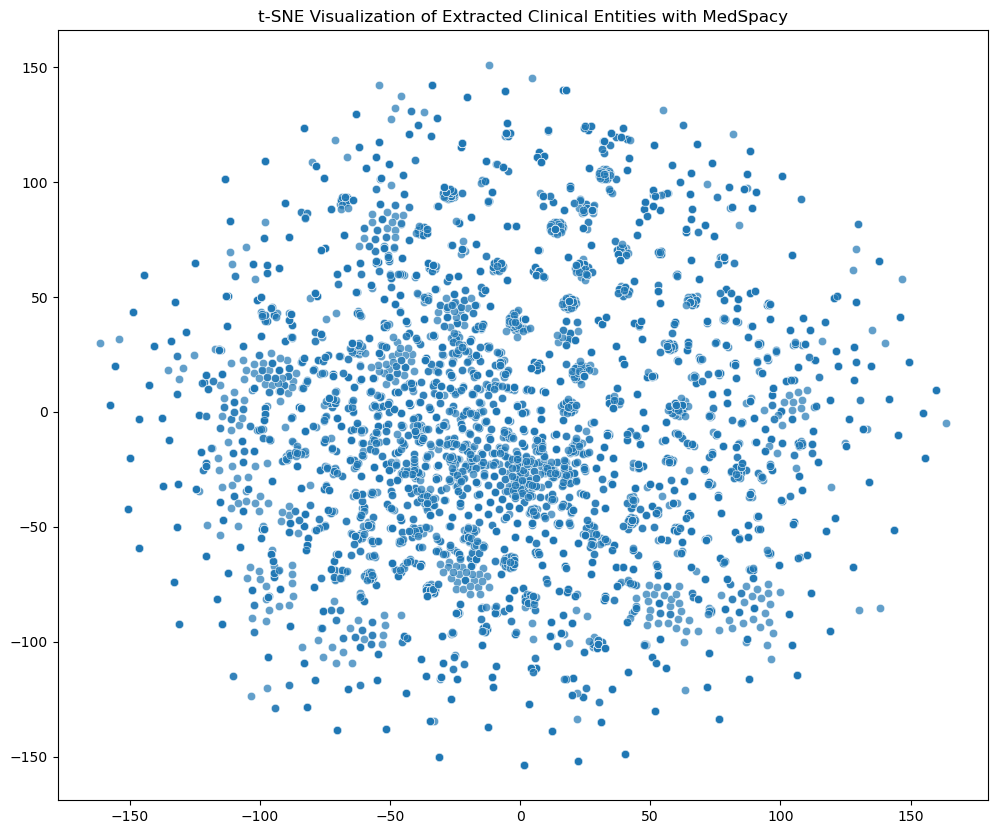

In [121]:
import spacy
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE

# Load the clinical NER model
nlp = spacy.load("en_ner_bc5cdr_md")

# Select insomnia patients with ICD-9 code 78052
selected_disease_codes = ['78052']
n = 50  # Number of records to process
selected_disease_patients_df = insomnia_patients_df[insomnia_patients_df['ICD9_CODE'].isin(selected_disease_codes)].head(n)

print("Size of selected_disease_patients_df:", selected_disease_patients_df.shape)

df = selected_disease_patients_df

# Extract entities from patient notes
corpus = []
entity_labels = []
entity_vectors = []

for row in range(len(df)):
    doc = nlp(df.iloc[row]['TEXT'])
    tokens = doc.ents  # Extract entities
    str_tokens = [token.text for token in tokens]
    corpus.append(str_tokens)

    # Store entity labels and vectors
    for ent in tokens:
        if ent.vector_norm:  # Only keep entities with valid word vectors
            entity_labels.append(ent.text)
            entity_vectors.append(ent.vector)

# Convert to NumPy array
entity_vectors = np.array(entity_vectors)

if len(entity_vectors) == 0:
    print("No valid entity vectors found. Ensure your model supports word vectors.")
else:
    # Ensure perplexity < number of samples
    perplexity = min(10, len(entity_vectors) - 1)

    # Apply t-SNE
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42)
    reduced_vectors = tsne.fit_transform(entity_vectors)

    # Create scatter plot
    plt.figure(figsize=(12, 10))
    sns.scatterplot(x=reduced_vectors[:, 0], y=reduced_vectors[:, 1], alpha=0.7)

    # Annotate points with entity labels
    #for i, label in enumerate(entity_labels):
    #    plt.annotate(label, (reduced_vectors[i, 0], reduced_vectors[i, 1]), fontsize=10, alpha=0.75)

    plt.title("t-SNE Visualization of Extracted Clinical Entities with MedSpacy")
    plt.show()


Size of selected_disease_patients_df: (50, 2)


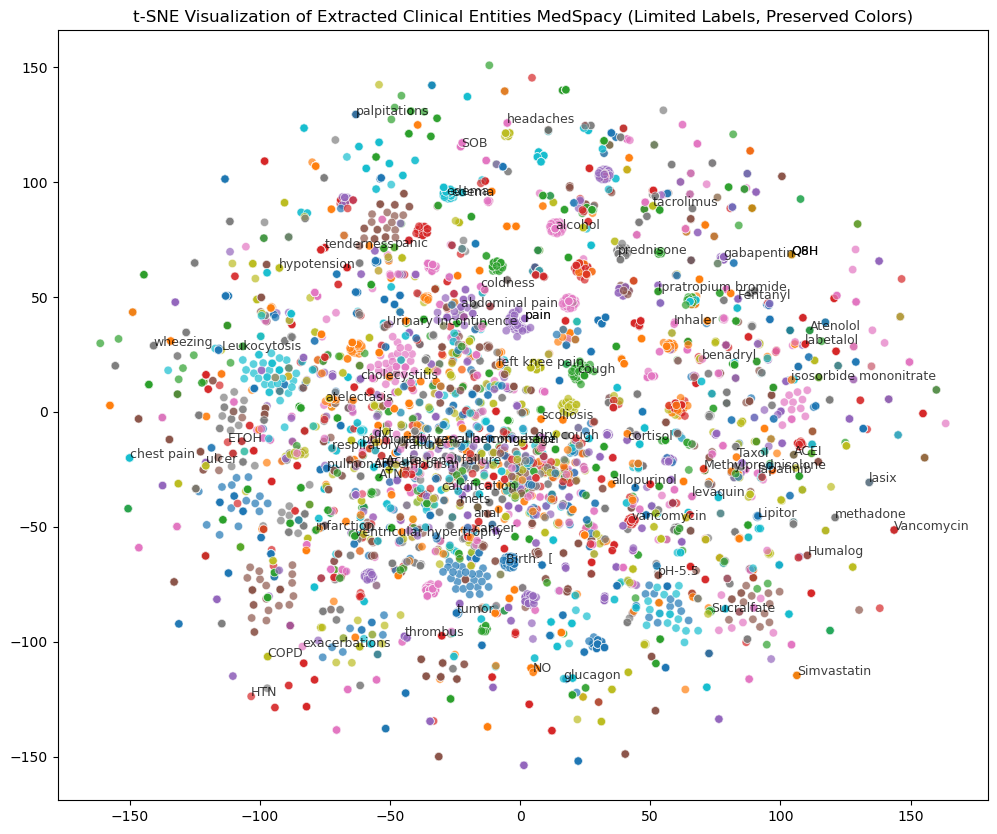

In [122]:
import spacy
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE

# Load the clinical NER model
nlp = spacy.load("en_ner_bc5cdr_md")

# Select insomnia patients with ICD-9 code 78052
selected_disease_codes = ['78052']
n = 50  # Number of records to process
selected_disease_patients_df = insomnia_patients_df[insomnia_patients_df['ICD9_CODE'].isin(selected_disease_codes)].head(n)

print("Size of selected_disease_patients_df:", selected_disease_patients_df.shape)

df = selected_disease_patients_df

# Extract entities from patient notes
corpus = []
entity_labels = []
entity_vectors = []

for row in range(len(df)):
    doc = nlp(df.iloc[row]['TEXT'])
    tokens = doc.ents  # Extract entities
    str_tokens = [token.text for token in tokens]
    corpus.append(str_tokens)

    # Store entity labels and vectors
    for ent in tokens:
        if ent.vector_norm:  # Only keep entities with valid word vectors
            entity_labels.append(ent.text)
            entity_vectors.append(ent.vector)

# Convert to NumPy array
entity_vectors = np.array(entity_vectors)

if len(entity_vectors) == 0:
    print("No valid entity vectors found. Ensure your model supports word vectors.")
else:
    # Ensure perplexity < number of samples
    perplexity = min(10, len(entity_vectors) - 1)

    # Apply t-SNE
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42)
    reduced_vectors = tsne.fit_transform(entity_vectors)

    # Select a subset of points to label (max 75)
    num_labels = min(75, len(entity_labels))
    labeled_indices = random.sample(range(len(entity_labels)), num_labels)

    # Create scatter plot with different colors
    plt.figure(figsize=(12, 10))
    scatter = sns.scatterplot(x=reduced_vectors[:, 0], y=reduced_vectors[:, 1], hue=entity_labels, palette="tab10", alpha=0.7, legend=False)

    # Annotate only the selected subset of points
    for i in labeled_indices:
        plt.annotate(entity_labels[i], (reduced_vectors[i, 0], reduced_vectors[i, 1]), fontsize=9, alpha=0.75)

    plt.title("t-SNE Visualization of Extracted Clinical Entities MedSpacy (Limited Labels, Preserved Colors)")
    plt.show()

